In [1]:
from model import Unet
from dataset import WaterBodyDataset, CarvanaDataset
import torch.optim as optim
import torch.nn as nn
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import *

In [5]:
DEVICE = "cuda"
EPOCHS = 10
CHANNELS_IN = 3
CHANNELS_OUT = 1
LEARNING_RATE = 1e-5
INPUT_SIZE = (240,240)
TRAIN_BATCH_SIZE = 60
VALID_BATCH_SIZE = 29

In [6]:
tf = A.Compose(
    [
        A.Resize(INPUT_SIZE[0], INPUT_SIZE[1]),
        A.Normalize(
            mean = [0.0,0.0,0.0],
            std=[1.0,1.0,1.0],
            max_pixel_value=255.0),
        A.Rotate(limit=32, p=1.0),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
            ToTensorV2()   
    ]
)

tf_valid = A.Compose(
    [
        A.Resize(INPUT_SIZE[0], INPUT_SIZE[1]),
        A.Normalize(
            mean = [0.0,0.0,0.0],
            std=[1.0,1.0,1.0],
            max_pixel_value=255.0),
            ToTensorV2()
    ]
)
data_root_path = "D:/AI_ML/Kaggle/Water Bodies Dataset/"
carvana_root_path = "D:/AI_ML/Kaggle/carvana/"
water_dataset = WaterBodyDataset(data_root_path, tf)
valid, train = random_split(water_dataset,[841, 2000], generator=torch.Generator().manual_seed(42))

#HACK need a better way 
valid.transform = tf_valid

#carvana_dataset = CarvanaDataset(carvana_root_path, tf)
#valid, train = random_split(carvana_dataset, [1088, 4000], generator=torch.Generator().manual_seed(42))

train_loader = torch.utils.data.DataLoader(train, batch_size=TRAIN_BATCH_SIZE, shuffle=True, num_workers=0)
valid_loader = torch.utils.data.DataLoader(valid, batch_size=VALID_BATCH_SIZE, shuffle=True, num_workers=0)


In [ ]:
from train import train_func, valid_func, test_func, compare_models
unet = Unet(CHANNELS_IN, CHANNELS_OUT).to(DEVICE)
unet.load_state_dict(torch.load("79_model_water_3.pth"))
#unet = torch.load("model_water_2.7th")
#print(unet)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(unet.parameters(), lr=LEARNING_RATE)

scaler = torch.cuda.amp.GradScaler()

train_loss = []
valid_loss = []
for epoch in range(EPOCHS):
    model_name = f"{80+epoch}_model_water_3.pth"

    loss = train_func(epoch=epoch, train_loader=train_loader, optimizer=optimizer, model=unet, criterion=criterion, scaler=scaler)

    valid = valid_func(epoch=epoch, valid_loader=valid_loader, model=unet, criterion=criterion)
    torch.save(unet.state_dict(), model_name)    
        



#torch.save(unet, "model_water_3.pth")

In [ ]:
import matplotlib.pyplot as plt
def show_image_mask(input, label, prediction):
    fig, axs = plt.subplots(1, 3, figsize=(20,20))

    axs[0].set_title("input")
    
    img = input.numpy()
    img = img.transpose(1,2,0)
    
    axs[0].imshow(img)
    axs[1].set_title("label")
    axs[1].imshow(label,cmap=plt.get_cmap('gray'))
    axs[2].set_title("prediction")
    axs[2].imshow(prediction,cmap=plt.get_cmap('gray'))


In [ ]:
data = iter(valid_loader)

#unet = torch.load("27_model_water_3.pt
unet = Unet(3,1).to(DEVICE)
unet.load_state_dict(torch.load("29_model_water_3.pth"))h")
unet.eval()

dupa = data.next()
#print(dupa[1].shape)
imgs = dupa[0]
msks = dupa[1]
for img,msk in zip(imgs,msks):

    out = unet(img.unsqueeze(0).to("cuda"))
    show_image_mask(img, msk, out.detach().squeeze(0).squeeze(0).to("cpu"))

In [ ]:
from train import train_func, valid_func, test_func

unet = Unet(3,1).to(DEVICE)
unet.load_state_dict(torch.load("29_model_water_3.pth"))
unet.eval()
test_func(dupa, unet, None)

d:\AI_ML\UNet-WaterSegmentation\utils.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, len(data.keys()), figsize=(20,20))


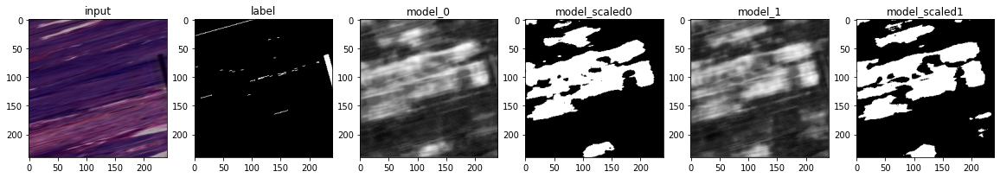

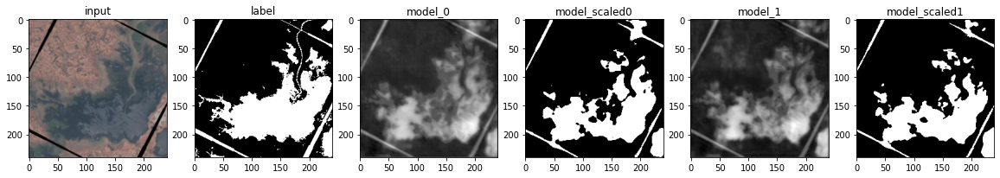

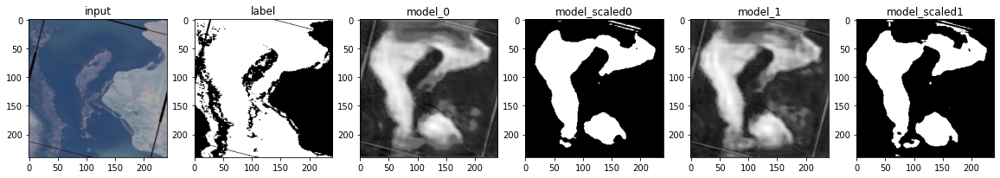

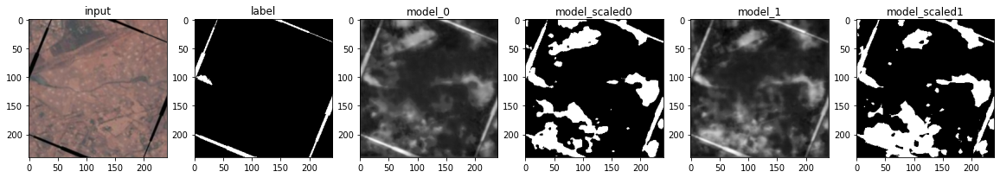

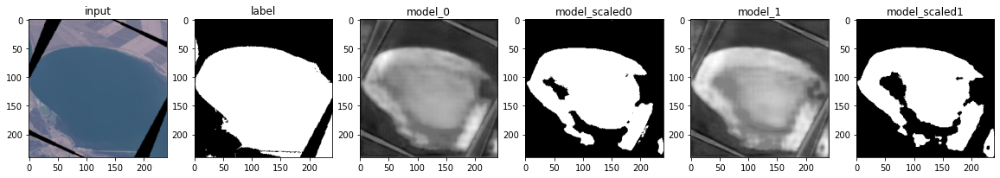

...

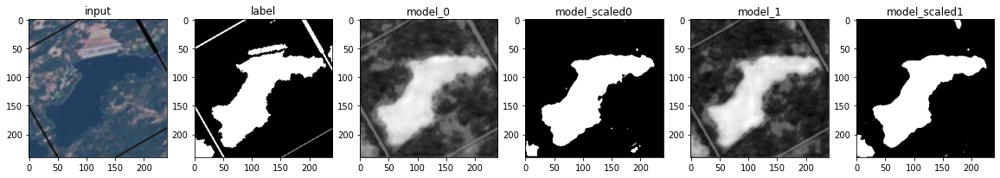

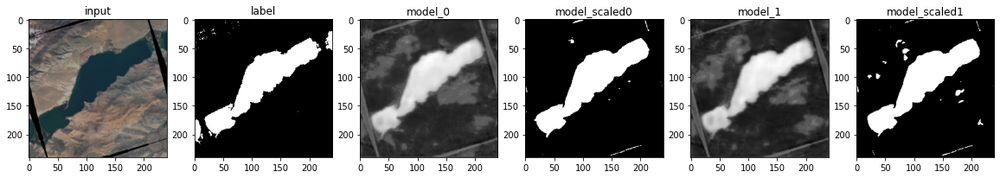

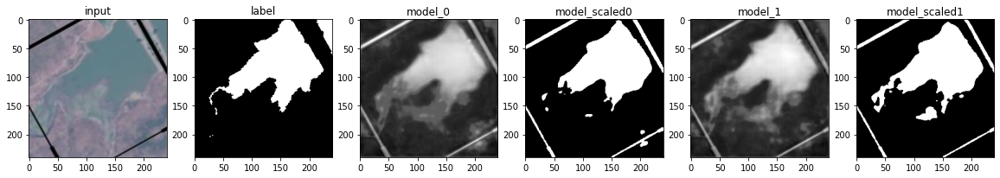

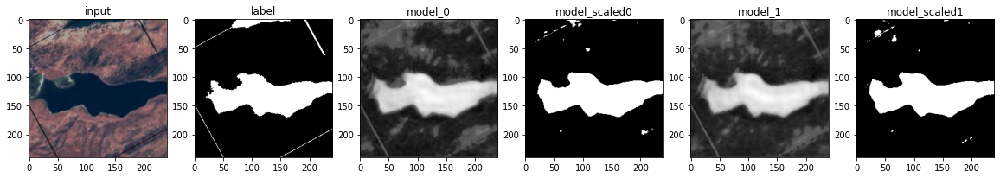

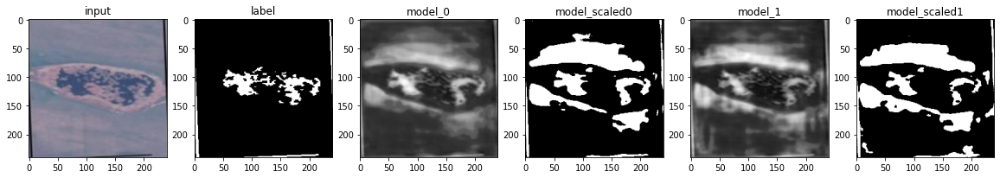

In [4]:
from train import train_func, valid_func, test_func, compare_models
model1 = Unet(3,1).to(DEVICE)
model1.load_state_dict(torch.load("27_model_water_3.pth"))

model2 = Unet(3,1).to(DEVICE)
model2.load_state_dict(torch.load("75_model_water_3.pth"))

data = iter(valid_loader)
dupa = data.next()
compare_models(dupa, [model1, model2])